#Esto es un membrete


### Contexto del Dataset
El conjunto de datos proporcionado parece contener información sobre la cobertura de redes de telecomunicaciones en Colombia. Esta información es crucial en un país donde la conectividad es un factor determinante para el desarrollo económico, social y tecnológico. La disponibilidad de cobertura de red, ya sea 2G, 3G, 4G, LTE o incluso 5G, es fundamental para garantizar la comunicación efectiva y el acceso a servicios digitales en diversas regiones, desde las áreas urbanas hasta las zonas rurales y remotas. Además, este conjunto de datos probablemente sea utilizado por proveedores de servicios de telecomunicaciones, autoridades gubernamentales y otros actores interesados para monitorear y mejorar la infraestructura de telecomunicaciones en todo el país, buscando reducir la brecha digital y promover la inclusión digital en Colombia.

In [0]:
import pandas as pd
import pyspark
from pyspark import SparkContext
from pyspark.sql import *
from pyspark.sql.functions import *
from pyspark.sql.types import *
from pyspark import SparkFiles
import json
import seaborn as sns
import matplotlib.pyplot as plt

In [0]:
spark = SparkContext.getOrCreate()
spark = SparkSession.builder.appName("Proyecto1").getOrCreate()

sc = SparkContext.getOrCreate()
sql_c = SQLContext(sc)
sc

/databricks/spark/python/pyspark/sql/context.py:117: FutureWarning: Deprecated in 3.0.0. Use SparkSession.builder.getOrCreate() instead.
  warnings.warn(


SparkContext 

 Spark UI 

 
 Version 
 v3.3.2 
 Master 
 local[8] 
 AppName 
 Databricks Shell

##Descarga de los datos

In [0]:
datasetUno = "https://raw.githubusercontent.com/Aviles17/Tecnologia-SABERPRO/main/data/primera_mitad_cobertura.csv"
datasetDos = "https://raw.githubusercontent.com/Aviles17/Tecnologia-SABERPRO/main/data/segunda_mitad_cobertura.csv"

# Leer los datos en csv
df_uno = pd.read_csv(datasetUno)
df_dos = pd.read_csv(datasetDos, header=None)




## EDA del dataset de Cobertura Movil

In [0]:
# El segundo dataset no tiene los headers correctos así que se los asignaremos
# del primer dataset que si los contiene
df_dos.columns = df_uno.columns

# Unimos ambos dataframes
cobertura_df = pd.concat([df_uno, df_dos], ignore_index=True)

#Convertimos a PySpark
spark_cobertura = sql_c.createDataFrame(cobertura_df) 
display(spark_cobertura)


vista_spark_cobertura = spark_cobertura 


AÑO,TRIMESTRE,PROVEEDOR,COD DEPARTAMENTO,DEPARTAMENTO,COD MUNICIPIO,MUNICIPIO,CABECERA MUNICIPAL,COD CENTRO POBLADO,CENTRO POBLADO,COBERTURA 2G,COBERTURA 3G,"COBERTURA HSPA+, HSPA+DC",COBERTUTA 4G,COBERTURA LTE,COBERTURA 5G
2015,4,EMPRESA DE TELECOMUNICACIONES DE BOGOTA S.A. ESP,73,TOLIMA,73001.0,IBAGUÉ,N,7.3001015E7,EL TOTUMO,S,N,N,N,N,N
2015,4,COMUNICACION CELULAR S A COMCEL S A,68,SANTANDER,68190.0,CIMITARRA,N,6.8190012E7,CAMPO SECO,N,N,N,N,N,N
2015,4,COMUNICACION CELULAR S A COMCEL S A,19,CAUCA,19807.0,TIMBÍO,N,0.0,ANTOMORENO,N,N,N,N,N,N
2015,4,ALMACENES EXITO INVERSIONES S.A.S.,54,NORTE DE SANTANDER,54518.0,PAMPLONA,S,5.4518001E7,PAMPLONA,S,S,S,N,N,N
2015,4,COMUNICACION CELULAR S A COMCEL S A,19,CAUCA,19532.0,PATÍA,N,1.9532013E7,EL ESTRECHO,N,N,N,N,N,N
2015,4,COLOMBIA TELECOMUNICACIONES S.A. E.S.P.,76,VALLE DEL CAUCA,76736.0,SEVILLA,N,7.6736014E7,SAN ANTONIO,N,N,S,N,N,N
2015,4,COLOMBIA TELECOMUNICACIONES S.A. E.S.P.,88,"ARCHIPIÉLAGO DE SAN ANDRÉS, PROVIDENCIA Y SANTA CATALINA",88564.0,PROVIDENCIA,N,8.8564002E7,SOUTH WEST BAY,S,S,N,N,N,N
2015,4,COMUNICACION CELULAR S A COMCEL S A,19,CAUCA,19318.0,GUAPI,N,0.0,SANTA CLARA,N,N,N,N,N,N
2015,4,COMUNICACION CELULAR S A COMCEL S A,54,NORTE DE SANTANDER,54498.0,OCAÑA,S,5.4498001E7,OCAÑA,S,S,N,N,N,N
2015,4,COLOMBIA MOVIL S.A ESP,19,CAUCA,19455.0,MIRANDA,S,1.9455001E7,MIRANDA,S,S,S,N,N,N


### Diccionario

In [0]:
spark_cobertura.dtypes

Out[5]: [('AÑO', 'bigint'),
 ('TRIMESTRE', 'bigint'),
 ('PROVEEDOR', 'string'),
 ('COD DEPARTAMENTO', 'bigint'),
 ('DEPARTAMENTO', 'string'),
 ('COD MUNICIPIO', 'double'),
 ('MUNICIPIO', 'string'),
 ('CABECERA MUNICIPAL', 'string'),
 ('COD CENTRO POBLADO', 'double'),
 ('CENTRO POBLADO', 'string'),
 ('COBERTURA 2G', 'string'),
 ('COBERTURA 3G', 'string'),
 ('COBERTURA HSPA+, HSPA+DC', 'string'),
 ('COBERTUTA 4G', 'string'),
 ('COBERTURA LTE', 'string'),
 ('COBERTURA 5G', 'string')]

| Nombre              | Descripción                                                                                     | Tipo de Dato |
|---------------------|-------------------------------------------------------------------------------------------------|--------------|
| AÑO                 | Año de registro de los datos.                                                                    | bigint       |
| TRIMESTRE           | Trimestre del año de registro de los datos.                                                      | bigint       |
| PROVEEDOR           | Nombre del proveedor de servicios de telecomunicaciones.                                         | string       |
| COD DEPARTAMENTO    | Código del departamento al que pertenece el registro.                                             | bigint       |
| DEPARTAMENTO        | Nombre del departamento al que pertenece el registro.                                             | string       |
| COD MUNICIPIO       | Código del municipio al que pertenece el registro.                                                | double       |
| MUNICIPIO           | Nombre del municipio al que pertenece el registro.                                                | string       |
| CABECERA MUNICIPAL | Nombre de la cabecera municipal a la que pertenece el registro.                                    | string       |
| COD CENTRO POBLADO | Código del centro poblado al que pertenece el registro.                                           | double       |
| CENTRO POBLADO      | Nombre del centro poblado al que pertenece el registro.                                           | string       |
| COBERTURA 2G        | Información sobre la cobertura de red 2G en el registro.                                           | string       |
| COBERTURA 3G        | Información sobre la cobertura de red 3G en el registro.                                           | string       |
| COBERTURA HSPA+, HSPA+DC | Información sobre la cobertura de red HSPA+, HSPA+DC en el registro.                       | string       |
| COBERTUTA 4G        | Información sobre la cobertura de red 4G en el registro.                                           | string       |
| COBERTURA LTE       | Información sobre la cobertura de red LTE en el registro.                                          | string       |
| COBERTURA 5G        | Información sobre la cobertura de red 5G en el registro.                                           | string       |


In [0]:
display(spark_cobertura.describe())

summary,AÑO,TRIMESTRE,PROVEEDOR,COD DEPARTAMENTO,DEPARTAMENTO,COD MUNICIPIO,MUNICIPIO,CABECERA MUNICIPAL,COD CENTRO POBLADO,CENTRO POBLADO,COBERTURA 2G,COBERTURA 3G,"COBERTURA HSPA+, HSPA+DC",COBERTUTA 4G,COBERTURA LTE,COBERTURA 5G
count,407281,407281,407281,407281,407281,407230,407281,407281,407266,407281,407281,407281,407281,407281,407281,407281
mean,2019.0878803577873,2.5027978226335135,null,39.14275401995182,null,39548.582182059276,null,null,3.4014600222856805E7,null,null,null,null,null,null,null
stddev,2.3055941860530016,1.1217579289716373,null,25.736459708452585,null,25713.64319077363,null,null,2.752303051376449E7,null,null,null,null,null,null,null
min,2015,1,ALMACENES EXITO INVERSIONES S.A.S.,5,AMAZONAS,5001.0,ABEJORRAL,N,0.0,20 DE JULIO,N,N,N,N,N,N
max,2023,4,UNE EPM TELECOMUNICACIONES S.A.,99,VICHADA,99773.0,ÚTICA,S,9.9773027E7,ÚTICA,S,S,S,S,S,N


In [0]:
# Se decidió por utilizar los siguientes datos: 

columns_to_drop = ['TRIMESTRE', 'COD DEPARTAMENTO', 'DEPARTAMENTO', 'COD CENTRO POBLADO', 'CENTRO POBLADO', 'CABECERA MUNICIPAL']
spark_cobertura = spark_cobertura.drop(*columns_to_drop)

display(spark_cobertura)

AÑO,PROVEEDOR,COD MUNICIPIO,MUNICIPIO,COBERTURA 2G,COBERTURA 3G,"COBERTURA HSPA+, HSPA+DC",COBERTUTA 4G,COBERTURA LTE,COBERTURA 5G
2015,EMPRESA DE TELECOMUNICACIONES DE BOGOTA S.A. ESP,73001.0,IBAGUÉ,S,N,N,N,N,N
2015,COMUNICACION CELULAR S A COMCEL S A,68190.0,CIMITARRA,N,N,N,N,N,N
2015,COMUNICACION CELULAR S A COMCEL S A,19807.0,TIMBÍO,N,N,N,N,N,N
2015,ALMACENES EXITO INVERSIONES S.A.S.,54518.0,PAMPLONA,S,S,S,N,N,N
2015,COMUNICACION CELULAR S A COMCEL S A,19532.0,PATÍA,N,N,N,N,N,N
2015,COLOMBIA TELECOMUNICACIONES S.A. E.S.P.,76736.0,SEVILLA,N,N,S,N,N,N
2015,COLOMBIA TELECOMUNICACIONES S.A. E.S.P.,88564.0,PROVIDENCIA,S,S,N,N,N,N
2015,COMUNICACION CELULAR S A COMCEL S A,19318.0,GUAPI,N,N,N,N,N,N
2015,COMUNICACION CELULAR S A COMCEL S A,54498.0,OCAÑA,S,S,N,N,N,N
2015,COLOMBIA MOVIL S.A ESP,19455.0,MIRANDA,S,S,S,N,N,N


### Datos Numericos

In [0]:
from pyspark.sql.functions import isnan, when, count, col, sum

def get_numeric_columns(df):

    numeric_cols = [c for c in df.columns if df.select(c).dtypes[0][1] in ['int', 'float', 'double', "bigint"]]
    return numeric_cols

def show_numeric_columns(df):

    numeric_cols = get_numeric_columns(df)
    
    for col_name in numeric_cols:
        print(f"Columna: {col_name}")
        value_counts = df.groupBy(col_name).count().orderBy(col(col_name)).collect()
        for row in value_counts:
            print(f"{row[0]}: {row[1]}")
        print()

show_numeric_columns(spark_cobertura)


Columna: AÑO
2015: 10788
2016: 43349
2017: 42410
2018: 41321
2019: 43036
2020: 46213
2021: 47543
2022: 45028
2023: 32266

Columna: COD MUNICIPIO
5001.0: 1217
5002.0: 230
5004.0: 90
5021.0: 108
5030.0: 318
5031.0: 174
5034.0: 399
5036.0: 215
5038.0: 116
5040.0: 118
5042.0: 270
5044.0: 194
5045.0: 574
5051.0: 409
5055.0: 86
5059.0: 190
5079.0: 456
5086.0: 198
5088.0: 375
5091.0: 114
5093.0: 230
5101.0: 259
5107.0: 195
5113.0: 210
5120.0: 506
5125.0: 86
5129.0: 596
5134.0: 158
5138.0: 267
5142.0: 152
5145.0: 224
5147.0: 523
5148.0: 259
5150.0: 152
5154.0: 541
5172.0: 266
5190.0: 159
5197.0: 225
5206.0: 115
5209.0: 234
5212.0: 262
5234.0: 294
5237.0: 215
5240.0: 224
5250.0: 379
5264.0: 152
5266.0: 538
5282.0: 342
5284.0: 298
5306.0: 137
5308.0: 426
5310.0: 281
5313.0: 141
5315.0: 182
5318.0: 197
5321.0: 170
5347.0: 191
5353.0: 120
5360.0: 344
5361.0: 335
5364.0: 207
5368.0: 193
5376.0: 286
5380.0: 445
5390.0: 166
5400.0: 217
5411.0: 388
5425.0: 302
5440.0: 169
5467.0: 180
5475.0: 161
5480.

Plotting counts for column: AÑO


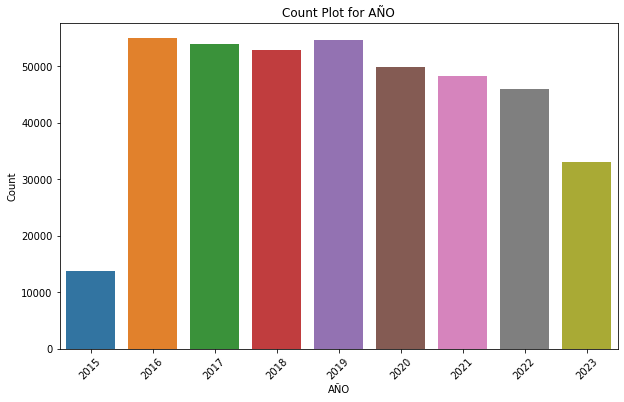

Plotting counts for column: COD MUNICIPIO


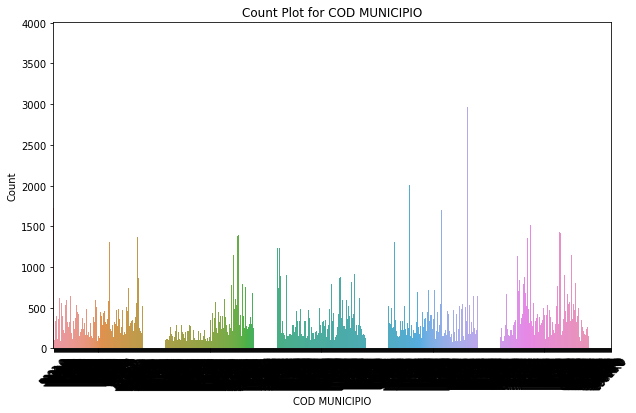

In [0]:
def plot_numeric_columns(df):
    numeric_cols = get_numeric_columns(df)
    
    for col_name in numeric_cols:
        print(f"Plotting counts for column: {col_name}")
        value_counts = df.groupBy(col_name).count().orderBy(col(col_name)).collect()
        counts_df = pd.DataFrame(value_counts, columns=[col_name, 'count'])
        
        plt.figure(figsize=(10, 6))
        sns.barplot(x=col_name, y='count', data=counts_df)
        plt.title(f'Count Plot for {col_name}')
        plt.xlabel(col_name)
        plt.ylabel('Count')
        plt.xticks(rotation=45)
        plt.show()

plot_numeric_columns(spark_cobertura)

In [0]:
# Podemos observar de qué manera la columna "COD CENTROS POBLADOS" cuentas con 55312 valores en 0, 
# lo cual dificultaría demasiado su visualización pues opacaría el resto de datos en una gráfica absoluta.
# Debido a esto, vamos a eliminar estos valores solo para la visualización por ahora.

aux_spark_cobertura = spark_cobertura
spark_cobertura = spark_cobertura.filter(col("COD CENTRO POBLADO") != 0)

# La columna "COD MUNICIPIO", aunque por suerte no cuenta con este problema, igual tiene demasiado datos en el
# el eje X como para poder considerarlos todos. Por esto, tomaremos también solo una cierta mayoría
# significativa en vez del df entero

Plotting counts for column: COD MUNICIPIO


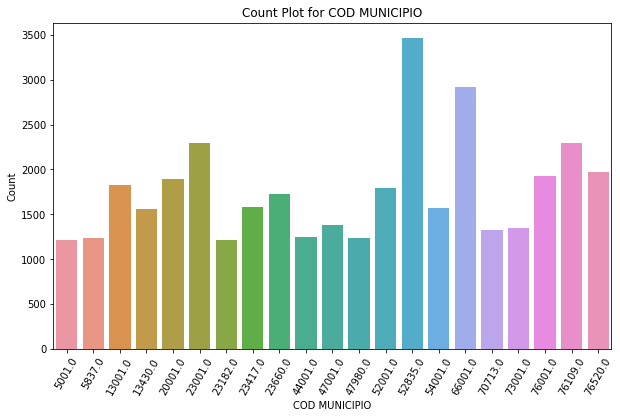

In [0]:
def plot_numeric_column(df, col_name):
    print(f"Plotting counts for column: {col_name}")
    value_counts = df.groupBy(col_name).count().orderBy(col(col_name)).filter(col("count") > 1200).collect()
    counts_df = pd.DataFrame(value_counts, columns=[col_name, 'count'])
    
    if not counts_df.empty:  # Check if counts_df is not empty
        plt.figure(figsize=(10, 6))
        sns.barplot(x=col_name, y='count', data=counts_df)
        plt.title(f'Count Plot for {col_name}')
        plt.xlabel(col_name)
        plt.ylabel('Count')
        plt.xticks(rotation=60)
        plt.show()

# Example usage:
plot_numeric_column(spark_cobertura, "COD MUNICIPIO")


### Datos String

In [0]:
def get_string_columns(df):
    string_cols = [c for c in df.columns if df.select(c).dtypes[0][1] == 'string']
    return string_cols

def show_string_columns(df):
    string_cols = get_string_columns(df)
    
    for col_name in string_cols:
        print(f"Columna: {col_name}")
        value_counts = df.groupBy(col_name).count().orderBy(col(col_name)).collect()
        for row in value_counts:
            print(f"{row[0]}: {row[1]}")
        print()

show_string_columns(spark_cobertura)

Columna: PROVEEDOR
ALMACENES EXITO INVERSIONES S.A.S.: 4511
AVANTEL S.A.S: 25952
COLOMBIA MOVIL  S.A ESP: 37027
COLOMBIA TELECOMUNICACIONES S.A. E.S.P.: 57274
COMUNICACION CELULAR S A COMCEL S A: 192447
EMPRESA DE TELECOMUNICACIONES DE BOGOTA S.A. ESP: 20450
PARTNERS TELECOM COLOMBIA SAS: 13546
UNE EPM TELECOMUNICACIONES S.A.: 747

Columna: MUNICIPIO
ABEJORRAL: 230
ABREGO: 190
ABRIAQUÍ: 90
ACACÍAS: 344
ACANDÍ: 284
ACEVEDO: 261
ACHÍ: 638
AGRADO: 194
AGUA DE DIOS: 158
AGUACHICA: 587
AGUADA: 86
AGUADAS: 431
AGUAZUL: 474
AGUSTÍN CODAZZI: 342
AIPE: 322
ALBANIA: 680
ALBÁN: 461
ALCALÁ: 188
ALDANA: 154
ALEJANDRÍA: 108
ALGARROBO: 372
ALGECIRAS: 271
ALMAGUER: 290
ALMEIDA: 106
ALPUJARRA: 194
ALTAMIRA: 196
ALTO BAUDÓ: 657
ALTOS DEL ROSARIO: 228
ALVARADO: 342
AMAGÁ: 318
AMALFI: 174
AMBALEMA: 258
ANAPOIMA: 328
ANCUYA: 112
ANDALUCÍA: 282
ANDES: 399
ANGELÓPOLIS: 215
ANGOSTURA: 116
ANOLAIMA: 290
ANORÍ: 118
ANSERMA: 214
ANSERMANUEVO: 268
ANZA: 194
ANZOÁTEGUI: 255
APARTADÓ: 574
APULO: 157
APÍA: 206
AQUIT

Plotting counts for column: PROVEEDOR


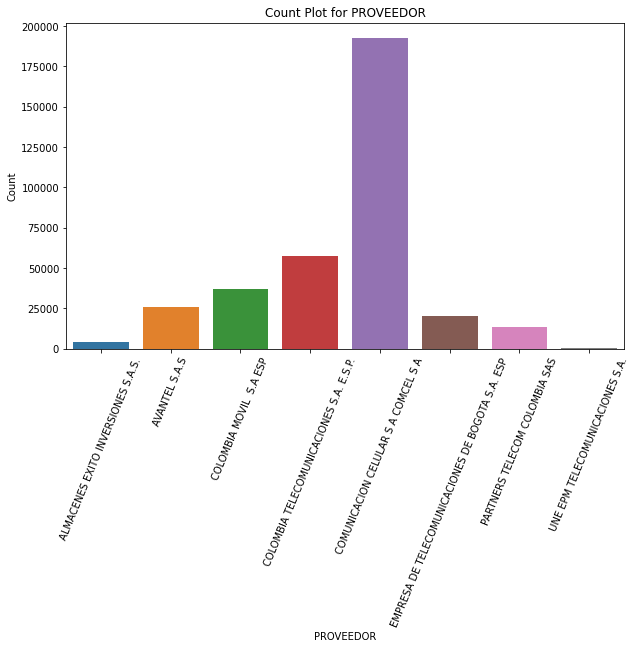

Plotting counts for column: MUNICIPIO


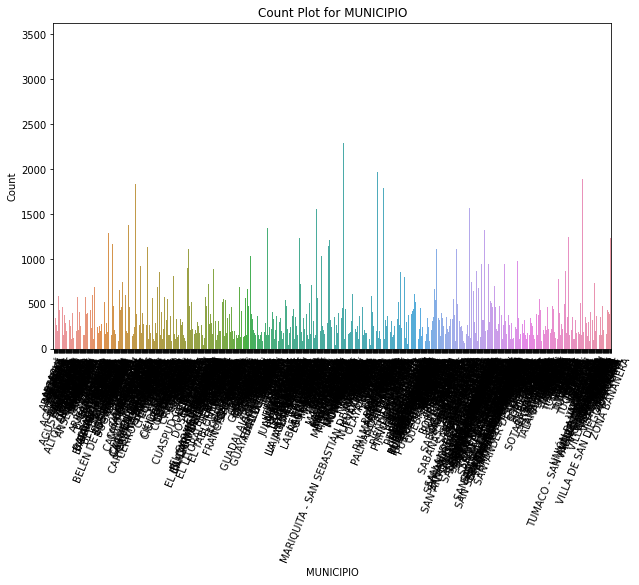

Plotting counts for column: COBERTURA 2G


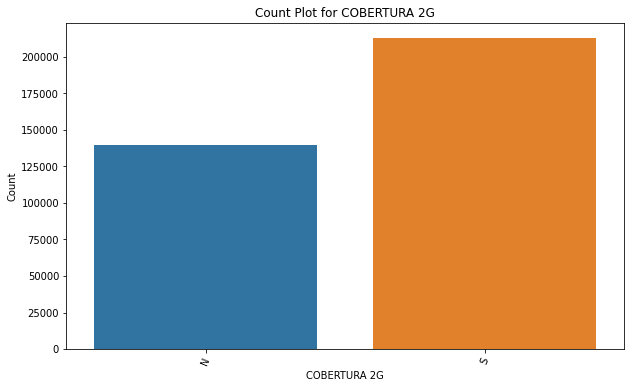

Plotting counts for column: COBERTURA 3G


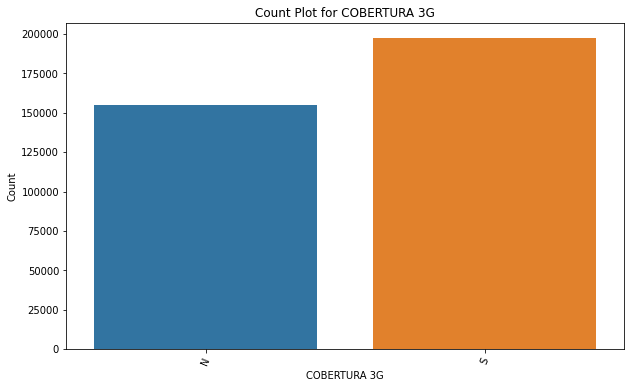

Plotting counts for column: COBERTURA HSPA+, HSPA+DC


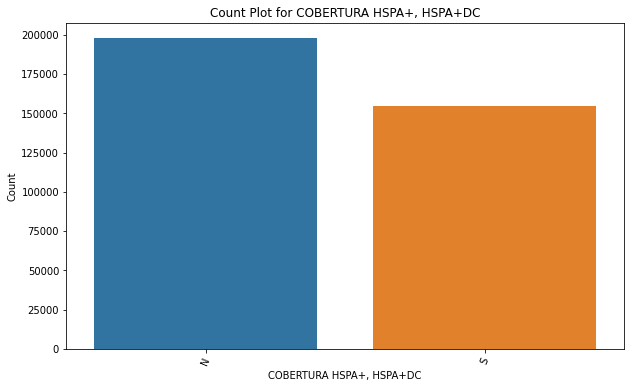

Plotting counts for column: COBERTUTA 4G


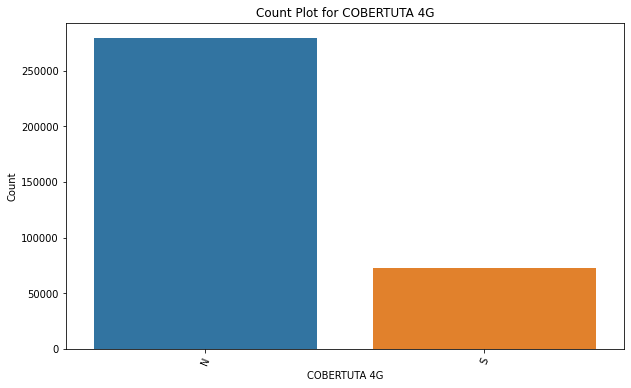

Plotting counts for column: COBERTURA LTE


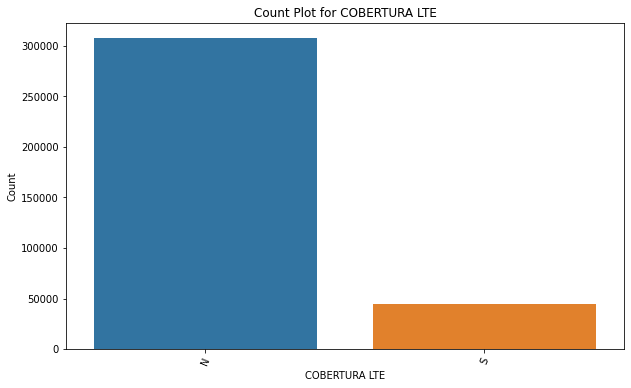

Plotting counts for column: COBERTURA 5G


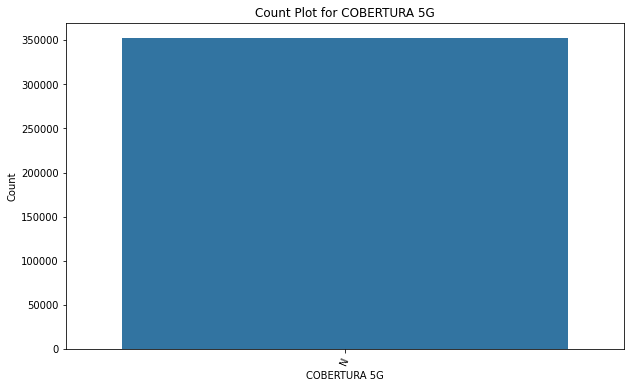

In [0]:
def plot_string_columns(df):
    string_cols = get_string_columns(df)
    for col_name in string_cols:
        print(f"Plotting counts for column: {col_name}")
        value_counts = df.groupBy(col_name).count().orderBy(col(col_name)).collect()
        counts_df = pd.DataFrame(value_counts, columns=[col_name, 'count'])
        plt.figure(figsize=(10, 6))
        sns.barplot(x=col_name, y='count', data=counts_df)
        plt.title(f'Count Plot for {col_name}')
        plt.xlabel(col_name)
        plt.ylabel('Count')
        plt.xticks(rotation=67.5)
        plt.show()

# Usage example
plot_string_columns(spark_cobertura)

Plotting counts for column: MUNICIPIO


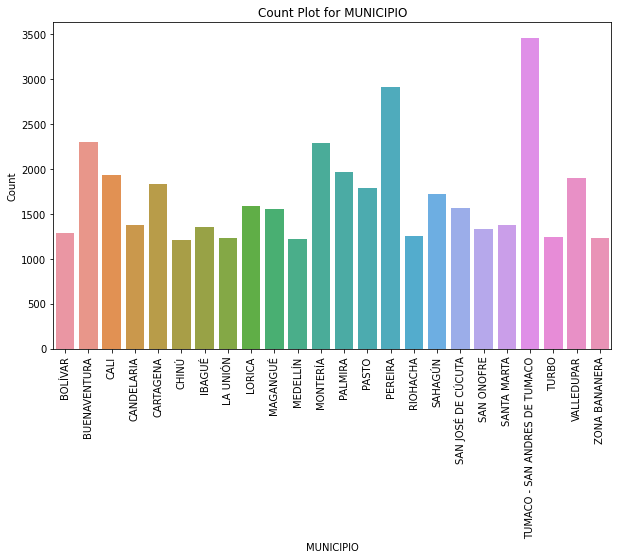

In [0]:
# Igual que como hicimos en la tabla de datos numericos, filtraremos ciertos datos de MUNICIPIOS y CENTROS POBLADOS para poder mostrarlo correctamente.
def plot_numeric_column(df, col_name):
    print(f"Plotting counts for column: {col_name}")
    value_counts = df.groupBy(col_name).count().orderBy(col(col_name)).filter(col("count") > 1200).collect()
    counts_df = pd.DataFrame(value_counts, columns=[col_name, 'count'])
    
    if not counts_df.empty:  # Check if counts_df is not empty
        plt.figure(figsize=(10, 6))
        sns.barplot(x=col_name, y='count', data=counts_df)
        plt.title(f'Count Plot for {col_name}')
        plt.xlabel(col_name)
        plt.ylabel('Count')
        plt.xticks(rotation=89.89)
        plt.show()

# Example usage:
plot_numeric_column(spark_cobertura, "MUNICIPIO")


### Nulos y Redundancia

In [0]:

(spark_cobertura.select([count(when(isnan(c) | col(c).isNull(), c)).alias(c) for c in spark_cobertura.columns]).show())

+---+---------+-------------+---------+------------+------------+------------------------+------------+-------------+------------+
|AÑO|PROVEEDOR|COD MUNICIPIO|MUNICIPIO|COBERTURA 2G|COBERTURA 3G|COBERTURA HSPA+, HSPA+DC|COBERTUTA 4G|COBERTURA LTE|COBERTURA 5G|
+---+---------+-------------+---------+------------+------------+------------------------+------------+-------------+------------+
|  0|        0|            0|        0|           0|           0|                       0|           0|            0|           0|
+---+---------+-------------+---------+------------+------------+------------------------+------------+-------------+------------+



In [0]:
spark_cobertura.select([count(when((col(c) == "None") | (col(c) == 0), c)).alias(c) for c in spark_cobertura.columns]).show()

+---+---------+-------------+---------+------------+------------+------------------------+------------+-------------+------------+
|AÑO|PROVEEDOR|COD MUNICIPIO|MUNICIPIO|COBERTURA 2G|COBERTURA 3G|COBERTURA HSPA+, HSPA+DC|COBERTUTA 4G|COBERTURA LTE|COBERTURA 5G|
+---+---------+-------------+---------+------------+------------+------------------------+------------+-------------+------------+
|  0|        0|            0|        0|           0|           0|                       0|           0|            0|           0|
+---+---------+-------------+---------+------------+------------+------------------------+------------+-------------+------------+



### Transformación de los datos

In [0]:
display(spark_cobertura)

AÑO,PROVEEDOR,COD MUNICIPIO,MUNICIPIO,COBERTURA 2G,COBERTURA 3G,"COBERTURA HSPA+, HSPA+DC",COBERTUTA 4G,COBERTURA LTE,COBERTURA 5G
2015,EMPRESA DE TELECOMUNICACIONES DE BOGOTA S.A. ESP,73001.0,IBAGUÉ,S,N,N,N,N,N
2015,COMUNICACION CELULAR S A COMCEL S A,68190.0,CIMITARRA,N,N,N,N,N,N
2015,ALMACENES EXITO INVERSIONES S.A.S.,54518.0,PAMPLONA,S,S,S,N,N,N
2015,COMUNICACION CELULAR S A COMCEL S A,19532.0,PATÍA,N,N,N,N,N,N
2015,COLOMBIA TELECOMUNICACIONES S.A. E.S.P.,76736.0,SEVILLA,N,N,S,N,N,N
2015,COLOMBIA TELECOMUNICACIONES S.A. E.S.P.,88564.0,PROVIDENCIA,S,S,N,N,N,N
2015,COMUNICACION CELULAR S A COMCEL S A,54498.0,OCAÑA,S,S,N,N,N,N
2015,COLOMBIA MOVIL S.A ESP,19455.0,MIRANDA,S,S,S,N,N,N
2015,COLOMBIA MOVIL S.A ESP,5789.0,TÁMESIS,S,S,S,N,N,N
2015,COLOMBIA MOVIL S.A ESP,5321.0,GUATAPE,S,S,S,N,N,N


In [0]:
# Convertir 'S' a 1 y 'N' a 0 en las columnas especificadas
spark_cobertura_final = spark_cobertura.withColumn("COBERTURA 2G", when(spark_cobertura["COBERTURA 2G"] == "S", 1).otherwise(0)) \
                                  .withColumn("COBERTURA 3G", when(spark_cobertura["COBERTURA 3G"] == "S", 1).otherwise(0)) \
                                  .withColumn("COBERTURA HSPA+, HSPA+DC", when(spark_cobertura["COBERTURA HSPA+, HSPA+DC"] == "S", 1).otherwise(0)) \
                                  .withColumn("COBERTUTA 4G", when(spark_cobertura["COBERTUTA 4G"] == "S", 1).otherwise(0)) \
                                  .withColumn("COBERTURA LTE", when(spark_cobertura["COBERTURA LTE"] == "S", 1).otherwise(0)) \
                                  .withColumn("COBERTURA 5G", when(spark_cobertura["COBERTURA 5G"] == "S", 1).otherwise(0))


display(spark_cobertura_final)

AÑO,PROVEEDOR,COD MUNICIPIO,MUNICIPIO,COBERTURA 2G,COBERTURA 3G,"COBERTURA HSPA+, HSPA+DC",COBERTUTA 4G,COBERTURA LTE,COBERTURA 5G
2015,EMPRESA DE TELECOMUNICACIONES DE BOGOTA S.A. ESP,73001.0,IBAGUÉ,1,0,0,0,0,0
2015,COMUNICACION CELULAR S A COMCEL S A,68190.0,CIMITARRA,0,0,0,0,0,0
2015,ALMACENES EXITO INVERSIONES S.A.S.,54518.0,PAMPLONA,1,1,1,0,0,0
2015,COMUNICACION CELULAR S A COMCEL S A,19532.0,PATÍA,0,0,0,0,0,0
2015,COLOMBIA TELECOMUNICACIONES S.A. E.S.P.,76736.0,SEVILLA,0,0,1,0,0,0
2015,COLOMBIA TELECOMUNICACIONES S.A. E.S.P.,88564.0,PROVIDENCIA,1,1,0,0,0,0
2015,COMUNICACION CELULAR S A COMCEL S A,54498.0,OCAÑA,1,1,0,0,0,0
2015,COLOMBIA MOVIL S.A ESP,19455.0,MIRANDA,1,1,1,0,0,0
2015,COLOMBIA MOVIL S.A ESP,5789.0,TÁMESIS,1,1,1,0,0,0
2015,COLOMBIA MOVIL S.A ESP,5321.0,GUATAPE,1,1,1,0,0,0


### Visualización de datos

In [0]:
spark_cobertura_final.show(6)

+----+--------------------+-------------+-----------+------------+------------+------------------------+------------+-------------+------------+
| AÑO|           PROVEEDOR|COD MUNICIPIO|  MUNICIPIO|COBERTURA 2G|COBERTURA 3G|COBERTURA HSPA+, HSPA+DC|COBERTUTA 4G|COBERTURA LTE|COBERTURA 5G|
+----+--------------------+-------------+-----------+------------+------------+------------------------+------------+-------------+------------+
|2015|EMPRESA DE TELECO...|      73001.0|     IBAGUÉ|           1|           0|                       0|           0|            0|           0|
|2015|COMUNICACION CELU...|      68190.0|  CIMITARRA|           0|           0|                       0|           0|            0|           0|
|2015|ALMACENES EXITO I...|      54518.0|   PAMPLONA|           1|           1|                       1|           0|            0|           0|
|2015|COMUNICACION CELU...|      19532.0|      PATÍA|           0|           0|                       0|           0|            0

In [0]:

pdf = spark_cobertura_final.toPandas()

# Supongamos que tu DataFrame de pandas se llama 'pdf'
coberturas = ['COBERTURA 2G', 'COBERTURA 3G', 'COBERTURA HSPA+, HSPA+DC', 'COBERTUTA 4G', 'COBERTURA LTE', 'COBERTURA 5G']

for cobertura in coberturas:
    valor_counts = pdf[cobertura].value_counts()
    print(f"\nCantidad de filas para {cobertura}:")
    print(valor_counts)


Cantidad de filas para COBERTURA 2G:
1    212615
0    139339
Name: COBERTURA 2G, dtype: int64

Cantidad de filas para COBERTURA 3G:
1    197192
0    154762
Name: COBERTURA 3G, dtype: int64

Cantidad de filas para COBERTURA HSPA+, HSPA+DC:
0    197625
1    154329
Name: COBERTURA HSPA+, HSPA+DC, dtype: int64

Cantidad de filas para COBERTUTA 4G:
0    278819
1     73135
Name: COBERTUTA 4G, dtype: int64

Cantidad de filas para COBERTURA LTE:
0    307383
1     44571
Name: COBERTURA LTE, dtype: int64

Cantidad de filas para COBERTURA 5G:
0    351954
Name: COBERTURA 5G, dtype: int64


Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "/databricks/python/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3378, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<command-1886716659606592>", line 25, in <module>
    plt.ylim(0, max(coverage_counts) + 50000)
  File "/databricks/spark/python/pyspark/sql/utils.py", line 164, in wrapped
    return f(*args, **kwargs)
  File "/databricks/spark/python/pyspark/sql/functions.py", line 423, in max
    return _invoke_function_over_columns("max", col)
  File "/databricks/spark/python/pyspark/sql/functions.py", line 98, in _invoke_function_over_columns
    return _invoke_function(name, *(_to_java_column(col) for col in cols))
  File "/databricks/spark/python/pyspark/sql/functions.py", line 98, in <genexpr>
    return _invoke_function(name, *(_to_java_column(col) for col in cols))
  File "/databricks/spark/python/pyspark/sql/column.py", line 66, in _to_java_column
    raise TypeError(
TypeError: Invali

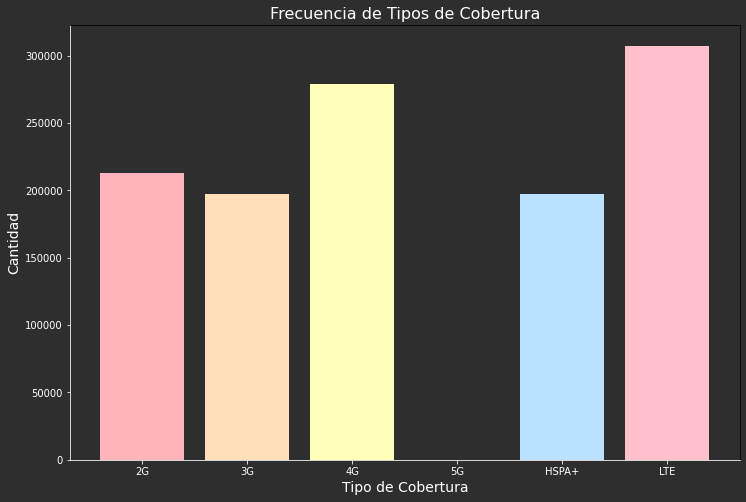

In [0]:
import matplotlib.pyplot as plt

# Datos
coverage_types = ['2G', '3G', '4G', '5G', 'HSPA+', 'LTE']
coverage_counts = [212615, 197192, 278819, 0, 197625, 307383]

# Colores pastel
colors = ['#FFB3BA', '#FFDFBA', '#FFFFBA', '#BAFFC9', '#BAE1FF', '#FFC0CB']

# Crear el gráfico de barras
plt.figure(figsize=(12, 8), facecolor='#2e2e2e')
bars = plt.bar(coverage_types, coverage_counts, color=colors)

# Configurar el fondo y texto en modo oscuro
plt.gca().set_facecolor('#2e2e2e')
plt.gca().tick_params(axis='x', colors='white')
plt.gca().tick_params(axis='y', colors='white')
plt.gca().spines['bottom'].set_color('white')
plt.gca().spines['left'].set_color('white')

# Agregar títulos y etiquetas
plt.title('Frecuencia de Tipos de Cobertura', fontsize=16, color='white')
plt.xlabel('Tipo de Cobertura', fontsize=14, color='white')
plt.ylabel('Cantidad', fontsize=14, color='white')
plt.ylim(0, max(coverage_counts) + 50000)

# Añadir líneas de cuadrícula
plt.grid(axis='y', linestyle='--', alpha=0.7, color='gray')

# Mostrar valores en las barras
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval + 5000, int(yval), ha='center', va='bottom', fontsize=12, color='white')

# Mostrar el gráfico
plt.show()


In [0]:
# Contar las ocurrencias de cada proveedor
proveedor_counts = pdf['PROVEEDOR'].value_counts()

# Mostrar los resultados
print(proveedor_counts)

COMUNICACION CELULAR S A COMCEL S A                 192447
COLOMBIA TELECOMUNICACIONES S.A. E.S.P.              57274
COLOMBIA MOVIL  S.A ESP                              37027
AVANTEL S.A.S                                        25952
EMPRESA DE TELECOMUNICACIONES DE BOGOTA S.A. ESP     20450
PARTNERS TELECOM COLOMBIA SAS                        13546
ALMACENES EXITO INVERSIONES S.A.S.                    4511
UNE EPM TELECOMUNICACIONES S.A.                        747
Name: PROVEEDOR, dtype: int64


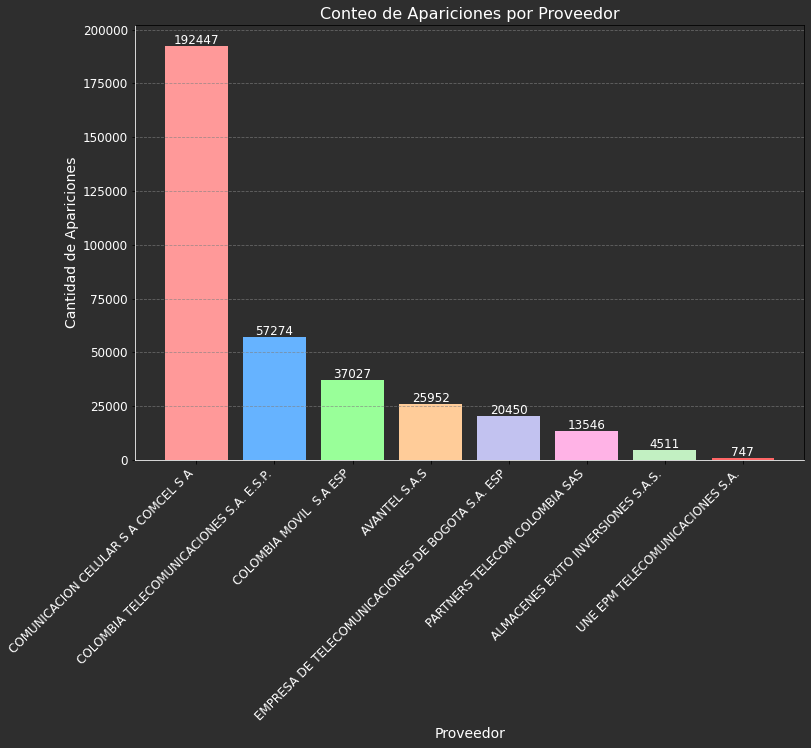

In [0]:
import pandas as pd
import matplotlib.pyplot as plt

# Datos proporcionados
data = {
    'PROVEEDOR': [
        'COMUNICACION CELULAR S A COMCEL S A',
        'COLOMBIA TELECOMUNICACIONES S.A. E.S.P.',
        'COLOMBIA MOVIL  S.A ESP',
        'AVANTEL S.A.S',
        'EMPRESA DE TELECOMUNICACIONES DE BOGOTA S.A. ESP',
        'PARTNERS TELECOM COLOMBIA SAS',
        'ALMACENES EXITO INVERSIONES S.A.S.',
        'UNE EPM TELECOMUNICACIONES S.A.'
    ],
    'COUNT': [
        192447,
        57274,
        37027,
        25952,
        20450,
        13546,
        4511,
        747
    ]
}

# Crear el DataFrame
pdf_counts = pd.DataFrame(data)

# Crear el gráfico de barras con fondo oscuro
plt.figure(figsize=(12, 8), facecolor='#2e2e2e')
bars = plt.bar(pdf_counts['PROVEEDOR'], pdf_counts['COUNT'], color=['#ff9999','#66b3ff','#99ff99','#ffcc99', '#c2c2f0', '#ffb3e6', '#c2f0c2', '#ff6666'])

# Personalizar el gráfico
plt.title('Conteo de Apariciones por Proveedor', fontsize=16, color='white')
plt.xlabel('Proveedor', fontsize=14, color='white')
plt.ylabel('Cantidad de Apariciones', fontsize=14, color='white')
plt.xticks(rotation=45, ha='right', fontsize=12, color='white')
plt.yticks(fontsize=12, color='white')

# Añadir etiquetas de los valores en las barras
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 1000, int(yval), ha='center', fontsize=12, color='white')

# Configurar el fondo oscuro del gráfico
plt.gca().set_facecolor('#2e2e2e')
plt.gca().spines['bottom'].set_color('white')
plt.gca().spines['left'].set_color('white')

# Añadir líneas de cuadrícula
plt.grid(axis='y', linestyle='--', alpha=0.7, color='gray')

# Mostrar el gráfico
plt.show()



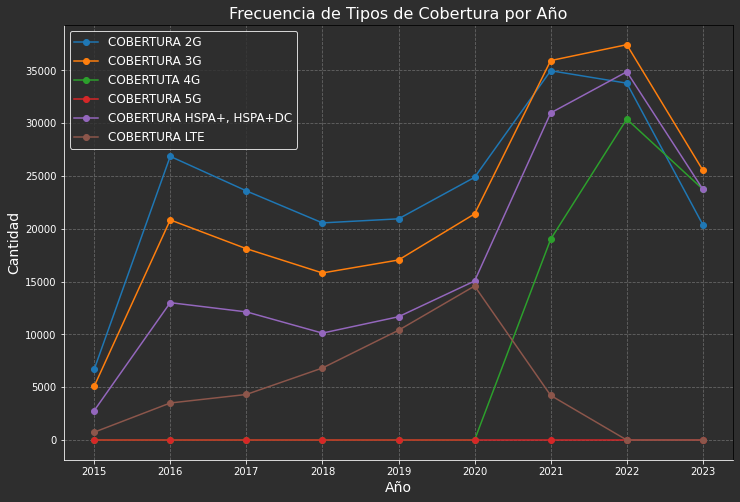

In [0]:

# Seleccionar las columnas de interés
coverage_columns = ["COBERTURA 2G", "COBERTURA 3G", "COBERTUTA 4G", "COBERTURA 5G", "COBERTURA HSPA+, HSPA+DC", "COBERTURA LTE"]

# Convertir las columnas de cobertura a enteros y realizar el groupby por año
aggregated_df = spark_cobertura_final.groupBy("AÑO").agg(
    *[sum(col(c).cast("int")).alias(c) for c in coverage_columns]
).orderBy("AÑO")

# Convertir el DataFrame de Spark a Pandas
df = aggregated_df.toPandas()

# Crear el gráfico de líneas
plt.figure(figsize=(12, 8), facecolor='#2e2e2e')
for column in coverage_columns:
    plt.plot(df['AÑO'], df[column], marker='o', label=column)

# Configurar el fondo y texto en modo oscuro
plt.gca().set_facecolor('#2e2e2e')
plt.gca().tick_params(axis='x', colors='white')
plt.gca().tick_params(axis='y', colors='white')
plt.gca().spines['bottom'].set_color('white')
plt.gca().spines['left'].set_color('white')

# Agregar títulos y etiquetas
plt.title('Frecuencia de Tipos de Cobertura por Año', fontsize=16, color='white')
plt.xlabel('Año', fontsize=14, color='white')
plt.ylabel('Cantidad', fontsize=14, color='white')

# Añadir líneas de cuadrícula
plt.grid(axis='both', linestyle='--', alpha=0.7, color='gray')

# Añadir leyenda
plt.legend(loc='upper left', fontsize=12, facecolor='#2e2e2e', edgecolor='white', labelcolor='white')

# Mostrar el gráfico
plt.show()

In [0]:
%sh
pip install folium

  Using cached folium-0.16.0-py2.py3-none-any.whl (100 kB)
  Using cached xyzservices-2024.4.0-py3-none-any.whl (81 kB)
  Using cached branca-0.7.2-py3-none-any.whl (25 kB)
  Using cached jinja2-3.1.4-py3-none-any.whl (133 kB)
  Attempting uninstall: jinja2
    Found existing installation: Jinja2 2.11.3
    Not uninstalling jinja2 at /databricks/python3/lib/python3.9/site-packages, outside environment /local_disk0/.ephemeral_nfs/envs/pythonEnv-568cf111-8d9f-4af8-a900-328090a1ffd3
    Can't uninstall 'Jinja2'. No files were found to uninstall.
You should consider upgrading via the '/local_disk0/.ephemeral_nfs/envs/pythonEnv-568cf111-8d9f-4af8-a900-328090a1ffd3/bin/python -m pip install --upgrade pip' command.


In [0]:


#Cargar dataset de ubicaciones geograficas
url_geo = "https://raw.githubusercontent.com/Aviles17/Tecnologia-SABERPRO/main/Procesado/Clasificador%20Geogr%C3%A1fico.csv"
df_geo  = pd.read_csv(url_geo)
df_geo.head(5)


,Código Municipio,Nombre Municipio,Longitud,Latitud
0,5001,MEDELLÍN,"-75,5760017134","6,24858636743"
1,5001,MEDELLÍN,"-75,6899859872","6,3439224059"
2,5001,MEDELLÍN,"-75,5003166982","6,20967456778"
3,5001,MEDELLÍN,"-75,6299441751","6,22248273057"
4,5001,MEDELLÍN,"-75,6339460169","6,2333355874"


In [0]:
df_geo['Longitud'] = df_geo['Longitud'].str.replace(',', '.').astype(float)
df_geo['Latitud'] = df_geo['Latitud'].str.replace(',', '.').astype(float)
df_geo.dtypes

Out[48]: Código Municipio      int64
Nombre Municipio     object
Longitud            float64
Latitud             float64
dtype: object

In [0]:
df_geo = df_geo.drop(df_geo[(df_geo['Latitud'] == 0) | (df_geo['Longitud'] == 0) | (df_geo['Latitud'].isnull()) | (df_geo['Longitud'].isnull())].index)

result_geo = df_geo.groupby('Código Municipio')[['Latitud', 'Longitud']].mean().reset_index()

result_geo

,Código Municipio,Latitud,Longitud
0,5001,6.249349,-75.588289
1,5002,5.766415,-75.466133
2,5004,6.653536,-76.076851
3,5021,6.376063,-75.141335
4,5030,6.051586,-75.700821
...,...,...,...
1115,97889,0.609142,-69.203336
1116,99001,5.998149,-68.116825
1117,99524,5.792002,-69.938948
1118,99624,4.994947,-70.949031


In [0]:
schema = StructType([
    StructField("Código Municipio", StringType(), True),
    StructField("Latitud", FloatType(), True),
    StructField("Longitud", FloatType(), True)
])
spark_geo = spark.createDataFrame(result_geo, schema=schema)
spark_geo = spark_geo.withColumnRenamed("Código Municipio", "COD MUNICIPIO")
display(spark_geo)

/databricks/spark/python/pyspark/sql/pandas/conversion.py:467: UserWarning: createDataFrame attempted Arrow optimization because 'spark.sql.execution.arrow.pyspark.enabled' is set to true; however, failed by the reason below:
  Expected a string or bytes dtype, got int64
Attempting non-optimization as 'spark.sql.execution.arrow.pyspark.fallback.enabled' is set to true.
  warn(msg)


COD MUNICIPIO,Latitud,Longitud
5001,6.249349,-75.58829
5002,5.7664146,-75.46613
5004,6.6535363,-76.07685
5021,6.376063,-75.141335
5030,6.051586,-75.70082
5031,6.855396,-75.00242
5034,5.6554546,-75.893105
5036,6.1031504,-75.71834
5038,6.84908,-75.411285
5040,7.07471,-75.148346


In [0]:
df_final_merge = spark_cobertura_final.join(spark_geo, on="COD MUNICIPIO", how='left')

In [0]:
# Unir los DataFrames en base al "Código Municipio"
df_final_merge = pd.merge(pdf, results_geo, left_on="COD MUNICIPIO", right_on="Código Municipio", how='left')

df_final_merge.head(60)

,AÑO,PROVEEDOR,COD MUNICIPIO,MUNICIPIO,COBERTURA 2G,COBERTURA 3G,"COBERTURA HSPA+, HSPA+DC",COBERTUTA 4G,COBERTURA LTE,COBERTURA 5G,Código Municipio,Latitud,Longitud
0,2015,EMPRESA DE TELECOMUNICACIONES DE BOGOTA S.A. ESP,73001.0,IBAGUÉ,1,0,0,0,0,0,73001.0,4.431078,-75.215232
1,2015,COMUNICACION CELULAR S A COMCEL S A,68190.0,CIMITARRA,0,0,0,0,0,0,68190.0,6.378381,-74.214513
2,2015,ALMACENES EXITO INVERSIONES S.A.S.,54518.0,PAMPLONA,1,1,1,0,0,0,54518.0,7.372848,-72.647685
3,2015,COMUNICACION CELULAR S A COMCEL S A,19532.0,PATÍA,0,0,0,0,0,0,19532.0,2.134806,-77.056306
4,2015,COLOMBIA TELECOMUNICACIONES S.A. E.S.P.,76736.0,SEVILLA,0,0,1,0,0,0,76736.0,4.317102,-75.913527
5,2015,COLOMBIA TELECOMUNICACIONES S.A. E.S.P.,88564.0,PROVIDENCIA,1,1,0,0,0,0,88564.0,13.354035,-81.378043
6,2015,COMUNICACION CELULAR S A COMCEL S A,54498.0,OCAÑA,1,1,0,0,0,0,54498.0,8.263934,-73.352502
7,2015,COLOMBIA MOVIL S.A ESP,19455.0,MIRANDA,1,1,1,0,0,0,19455.0,3.265209,-76.300090
8,2015,COLOMBIA MOVIL S.A ESP,5789.0,TÁMESIS,1,1,1,0,0,0,5789.0,5.666613,-75.697210
9,2015,COLOMBIA MOVIL S.A ESP,5321.0,GUATAPE,1,1,1,0,0,0,5321.0,6.235554,-75.156525


In [0]:
import pandas as pd
import folium
from folium.plugins import HeatMap

results_geo=result_geo
# Unir los DataFrames en base al "Código Municipio"
df_final_merge = pd.merge(pdf, results_geo, left_on="COD MUNICIPIO", right_on="Código Municipio", how='left')

# Seleccionar las columnas de interés y convertirlas a enteros
coverage_columns = ["COBERTURA 2G", "COBERTURA 3G", "COBERTUTA 4G", "COBERTURA 5G", "COBERTURA HSPA+, HSPA+DC", "COBERTURA LTE"]

# Asegurarse de que las columnas de cobertura sean enteros
for col in coverage_columns:
    df_final_merge[col] = df_final_merge[col].fillna(0).astype(int)

# Agrupar por municipio y sumar las coberturas
df_grouped = df_final_merge.groupby(["MUNICIPIO", "Latitud", "Longitud"], as_index=False)[coverage_columns].sum()

# Determinar la cobertura más popular
df_grouped["Cobertura_Mas_Popular"] = df_grouped[coverage_columns].idxmax(axis=1)

# Crear el mapa centrado en la latitud y longitud medias
m = folium.Map(location=[df_grouped['Latitud'].mean(), df_grouped['Longitud'].mean()], zoom_start=7)

# Crear el heatmap
heat_data = []
for _, row in df_grouped.iterrows():
    max_coverage = row["Cobertura_Mas_Popular"]
    heat_data.append([row['Latitud'], row['Longitud'], row[max_coverage]])

# Añadir el heatmap al mapa
HeatMap(heat_data, min_opacity=0.5, max_zoom=18, radius=15, blur=15, gradient={
    0.2: 'red', 

    1.0: 'red'
}).add_to(m)

# Añadir una leyenda al mapa con los colores correctos
legend_html = '''
<div style="position: fixed; 
     bottom: 50px; left: 50px; width: 200px; height: 160px; 
     border:2px solid grey; z-index:9999; font-size:14px;
     background-color:white; opacity: 0.8;
     ">
     <h4 style="margin: 10px;">Cobertura Leyenda</h4>
     <i style="background: blue; width: 18px; height: 18px; display: inline-block;"></i> 2G<br>
     <i style="background: lime; width: 18px; height: 18px; display: inline-block;"></i> 3G<br>
     <i style="background: orange; width: 18px; height: 18px; display: inline-block;"></i> 4G<br>
     <i style="background: red; width: 18px; height: 18px; display: inline-block;"></i> 5G<br>
     <i style="background: orange; width: 18px; height: 18px; display: inline-block;"></i> HSPA+<br>
     <i style="background: cyan; width: 18px; height: 18px; display: inline-block;"></i> LTE<br>
</div>
'''

m.get_root().html.add_child(folium.Element(legend_html))

# Mostrar el mapa
m


---------------------------------------------------------------------------
KeyError                                  Traceback (most recent call last)
File /databricks/python/lib/python3.9/site-packages/pandas/core/indexes/base.py:3621, in Index.get_loc(self, key, method, tolerance)
   3620 try:
-> 3621     return self._engine.get_loc(casted_key)
   3622 except KeyError as err:

File /databricks/python/lib/python3.9/site-packages/pandas/_libs/index.pyx:136, in pandas._libs.index.IndexEngine.get_loc()

File /databricks/python/lib/python3.9/site-packages/pandas/_libs/index.pyx:163, in pandas._libs.index.IndexEngine.get_loc()

File pandas/_libs/hashtable_class_helper.pxi:5198, in pandas._libs.hashtable.PyObjectHashTable.get_item()

File pandas/_libs/hashtable_class_helper.pxi:5206, in pandas._libs.hashtable.PyObjectHashTable.get_item()

KeyError: 'Cobertura_Mas_Popular'

The above exception was the direct cause of the following exception:

KeyError                                  Traceb

In [0]:
import pandas as pd
import folium
from folium.plugins import HeatMap


# Unir los DataFrames en base al "Código Municipio"
df_final_merge = pd.merge(pdf, results_geo, left_on="COD MUNICIPIO", right_on="Código Municipio", how='left')

# Seleccionar las columnas de interés y convertirlas a enteros
coverage_columns = ["COBERTURA 2G", "COBERTURA 3G", "COBERTUTA 4G", "COBERTURA 5G", "COBERTURA HSPA+, HSPA+DC", "COBERTURA LTE"]

# Asegurarse de que las columnas de cobertura sean enteros
for col in coverage_columns:
    df_final_merge[col] = df_final_merge[col].fillna(0).astype(int)

# Agrupar por municipio y sumar las coberturas
df_grouped = df_final_merge.groupby(["MUNICIPIO", "Latitud", "Longitud"], as_index=False)[coverage_columns].sum()

# Determinar la cobertura más popular
df_grouped["Cobertura_Mas_Popular"] = df_grouped[coverage_columns].idxmax(axis=1)

# Crear el mapa centrado en la latitud y longitud medias
m = folium.Map(location=[df_grouped['Latitud'].mean(), df_grouped['Longitud'].mean()], zoom_start=7)

# Colores específicos para cada tipo de cobertura
color_map = {
    "COBERTURA 2G": 'blue',
    "COBERTURA 3G": 'lime',
    "COBERTURA 4G": 'orange',
    "COBERTURA 5G": 'red',
    "COBERTURA HSPA+, HSPA+DC+, ": 'purple',
    "COBERTURA LTE": 'cyan'
}

# Crear el heatmap
for coverage, color in color_map.items():
    heat_data = []
    for _, row in df_grouped[df_grouped["Cobertura_Mas_Popular"] == coverage].iterrows():
        heat_data.append([row['Latitud'], row['Longitud'], 1])  # Intensidad fija en 1
    HeatMap(heat_data, min_opacity=0.5, max_zoom=18, radius=15, blur=15, gradient={0.2: color, 0.4: color, 0.6: color, 1.0: color}).add_to(m)

# Añadir una leyenda al mapa con los colores correctos
legend_html = '''
<div style="position: fixed; 
     bottom: 50px; left: 50px; width: 200px; height: 190px; 
     border:2px solid grey; z-index:9999; font-size:14px;
     background-color:white; opacity: 0.8;
     ">
     <h4 style="margin: 10px;">Cobertura Leyenda</h4>
     <i style="background: blue; width: 18px; height: 18px; display: inline-block;"></i> 2G<br>
     <i style="background: lime; width: 18px; height: 18px; display: inline-block;"></i> 3G<br>
     <i style="background: orange; width: 18px; height: 18px; display: inline-block;"></i> 4G<br>
     <i style="background: red; width: 18px; height: 18px; display: inline-block;"></i> 5G<br>
     <i style="background: purple; width: 18px; height: 18px; display: inline-block;"></i> HSPA+<br>
     <i style="background: cyan; width: 18px; height: 18px; display: inline-block;"></i> LTE<br>
</div>
'''

m.get_root().html.add_child(folium.Element(legend_html))

# Mostrar el mapa
m


Make this Notebook Trusted to load map: File -> Trust Notebook <iframe srcdoc="<!DOCTYPE html>
<html>
<head>
 
 <meta http-equiv="content-type" content="text/html; charset=UTF-8" />
 
 <script>
 L_NO_TOUCH = false;
 L_DISABLE_3D = false;
 </script>
 
 <style>html, body {width: 100%;height: 100%;margin: 0;padding: 0;}</style>
 <style>#map {position:absolute;top:0;bottom:0;right:0;left:0;}</style>
 <script src="https://cdn.jsdelivr.net/npm/leaflet@1.9.3/dist/leaflet.js"></script>
 <script src="https://code.jquery.com/jquery-3.7.1.min.js"></script>
 <script src="https://cdn.jsdelivr.net/npm/bootstrap@5.2.2/dist/js/bootstrap.bundle.min.js"></script>
 <script src="https://cdnjs.cloudflare.com/ajax/libs/Leaflet.awesome-markers/2.0.2/leaflet.awesome-markers.js"></script>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/leaflet@1.9.3/dist/leaflet.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/bootstrap@5.2.2/dist/css/bootstrap.min.css"/>
 <link rel="stylesheet" href="https://netdna.bootstrapcdn.com/bootstrap/3.0.0/css/bootstrap.min.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/@fortawesome/fontawesome-free@6.2.0/css/all.min.css"/>
 <link rel="stylesheet" href="https://cdnjs.cloudflare.com/ajax/libs/Leaflet.awesome-markers/2.0.2/leaflet.awesome-markers.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/gh/python-visualization/folium/folium/templates/leaflet.awesome.rotate.min.css"/>
 
 <meta name="viewport" content="width=device-width,
 initial-scale=1.0, maximum-scale=1.0, user-scalable=no" />
 <style>
 #map_6d90f1a7266b33ed35d677fa32963f00 {
 position: relative;
 width: 100.0%;
 height: 100.0%;
 left: 0.0%;
 top: 0.0%;
 }
 .leaflet-container { font-size: 1rem; }
 </style>
 
 <script src="https://cdn.jsdelivr.net/gh/python-visualization/folium@main/folium/templates/leaflet_heat.min.js"></script>
</head>
<body>
 
 
<div style="position: fixed; 
 bottom: 50px; left: 50px; width: 200px; height: 190px; 
 border:2px solid grey; z-index:9999; font-size:14px;
 background-color:white; opacity: 0.8;
 ">
 <h4 style="margin: 10px;">Cobertura Leyenda</h4>
 <i style="background: blue; width: 18px; height: 18px; display: inline-block;"></i> 2G<br>
 <i style="background: lime; width: 18px; height: 18px; display: inline-block;"></i> 3G<br>
 <i style="background: orange; width: 18px; height: 18px; display: inline-block;"></i> 4G<br>
 <i style="background: red; width: 18px; height: 18px; display: inline-block;"></i> 5G<br>
 <i style="background: purple; width: 18px; height: 18px; display: inline-block;"></i> HSPA+<br>
 <i style="background: cyan; width: 18px; height: 18px; display: inline-block;"></i> LTE<br>
</div>
 
 <div class="folium-map" id="map_6d90f1a7266b33ed35d677fa32963f00" ></div>
 
</body>
<script>
 
 
 var map_6d90f1a7266b33ed35d677fa32963f00 = L.map(
 "map_6d90f1a7266b33ed35d677fa32963f00",
 {
 center: [5.613471626777374, -74.6519561945227],
 crs: L.CRS.EPSG3857,
 zoom: 7,
 zoomControl: true,
 preferCanvas: false,
 }
 );

 

 
 
 var tile_layer_5ee918ba9fd06782e38d35b60b609a99 = L.tileLayer(
 "https://tile.openstreetmap.org/{z}/{x}/{y}.png",
 {"attribution": "\u0026copy; \u003ca href=\"https://www.openstreetmap.org/copyright\"\u003eOpenStreetMap\u003c/a\u003e contributors", "detectRetina": false, "maxNativeZoom": 19, "maxZoom": 19, "minZoom": 0, "noWrap": false, "opacity": 1, "subdomains": "abc", "tms": false}
 );
 
 
 tile_layer_5ee918ba9fd06782e38d35b60b609a99.addTo(map_6d90f1a7266b33ed35d677fa32963f00);
 
 
 var heat_map_86e6bb82c6718494f256321c55d001d3 = L.heatLayer(
 [[7.961906055675, -73.16758719415, 1], [3.9344408192399998, -73.6406656299143, 1], [8.48788462142125, -77.2618512534125, 1], [8.58832652332, -74.51992173475, 1], [4.37531467846, -74.6692192503, 1], [8.190891355797273, -73.66169181132727, 1], [5.146821148368, -72.59985321101, 1], [3.254412673991667, -75.38393321705, 1], [11.197300682883332, -72.51770525243333, 1], [4.90116280624, -74.446557059425, 1], [4.67453349

In [0]:
df_grouped.head(50)

,MUNICIPIO,Latitud,Longitud,COBERTURA 2G,COBERTURA 3G,COBERTUTA 4G,COBERTURA 5G,"COBERTURA HSPA+, HSPA+DC",COBERTURA LTE,Cobertura_Mas_Popular
0,ABEJORRAL,5.766415,-75.466133,164,191,40,0,188,18,COBERTURA 3G
1,ABREGO,7.961906,-73.167587,152,130,42,0,95,36,COBERTURA 2G
2,ABRIAQUÍ,6.653536,-76.076851,48,58,20,0,58,7,COBERTURA 3G
3,ACACÍAS,3.934441,-73.640666,311,266,110,0,213,82,COBERTURA 2G
4,ACANDÍ,8.487885,-77.261851,148,126,58,0,106,29,COBERTURA 2G
5,ACEVEDO,1.781334,-75.939330,103,155,32,0,110,22,COBERTURA 3G
6,ACHÍ,8.588327,-74.519922,317,258,50,0,136,22,COBERTURA 2G
7,AGRADO,2.224062,-75.725837,144,146,39,0,75,15,COBERTURA 3G
8,AGUA DE DIOS,4.375315,-74.669219,138,130,42,0,127,52,COBERTURA 2G
9,AGUACHICA,8.190891,-73.661692,426,355,124,0,267,106,COBERTURA 2G


In [0]:
import pandas as pd
import folium
from folium.plugins import HeatMap

# Supongamos que ya tienes los DataFrames pdf y results_geo cargados

# Convertir results_geo a DataFrame de Pandas si no lo está ya
results_geo = pd.DataFrame({
    'Código Municipio': [5001, 5002, 5004],
    'Latitud': [6.249349, 5.766415, 6.653536],
    'Longitud': [-75.588289, -75.466133, -76.076851]
    # Añade aquí el resto de los datos...
})

# Unir los DataFrames en base al "Código Municipio"
df_final_merge = pd.merge(pdf, results_geo, left_on="COD MUNICIPIO", right_on="Código Municipio", how='left')

# Seleccionar las columnas de interés y convertirlas a enteros
coverage_columns = ["COBERTURA 2G", "COBERTURA 3G", "COBERTUTA 4G", "COBERTURA 5G", "COBERTURA HSPA+, HSPA+DC", "COBERTURA LTE"]

# Asegurarse de que las columnas de cobertura sean enteros
for col in coverage_columns:
    df_final_merge[col] = df_final_merge[col].fillna(0).astype(int)

# Agrupar por municipio y sumar las coberturas
df_grouped = df_final_merge.groupby(["MUNICIPIO", "Latitud", "Longitud"], as_index=False)[coverage_columns].sum()

# Colores específicos para cada tipo de cobertura
color_map = {
    "COBERTURA 2G": 'blue',
    "COBERTURA 3G": 'lime',
    "COBERTUTA 4G": 'orange',
    "COBERTURA 5G": 'red',
    "COBERTURA HSPA+, HSPA+DC": 'purple',
    "COBERTURA LTE": 'cyan'
}

# Crear una función para mostrar el mapa de calor para un tipo de cobertura
def show_heatmap_for_coverage(coverage_type):
    # Crear el mapa centrado en la latitud y longitud medias
    m = folium.Map(location=[df_grouped['Latitud'].mean(), df_grouped['Longitud'].mean()], zoom_start=7)
    
    # Crear el heatmap para el tipo de cobertura especificado
    heat_data = []
    for _, row in df_grouped.iterrows():
        heat_data.append([row['Latitud'], row['Longitud'], row[coverage_type]])  # Usar el valor específico de cobertura
    HeatMap(heat_data, min_opacity=0.5, max_zoom=18, radius=15, blur=15, gradient={
        0.2: color_map[coverage_type], 
        0.4: color_map[coverage_type], 
        0.6: color_map[coverage_type], 
        1.0: color_map[coverage_type]
    }).add_to(m)

    # Añadir una leyenda al mapa con el color correcto
    legend_html = f'''
    <div style="position: fixed; 
         bottom: 50px; left: 50px; width: 200px; height: 80px; 
         border:2px solid grey; z-index:9999; font-size:14px;
         background-color:white; opacity: 0.8;
         ">
         <h4 style="margin: 10px;">Cobertura Leyenda</h4>
         <i style="background: {color_map[coverage_type]}; width: 18px; height: 18px; display: inline-block;"></i> {coverage_type}<br>
    </div>
    '''
    m.get_root().html.add_child(folium.Element(legend_html))
    
    # Mostrar el mapa
    return m

# Ejemplo de cómo mostrar el heatmap para cada tipo de cobertura
heatmap_2g = show_heatmap_for_coverage("COBERTURA 2G")
heatmap_3g = show_heatmap_for_coverage("COBERTURA 3G")
heatmap_4g = show_heatmap_for_coverage("COBERTUTA 4G")
heatmap_5g = show_heatmap_for_coverage("COBERTURA 5G")
heatmap_hspa = show_heatmap_for_coverage("COBERTURA HSPA+, HSPA+DC")
heatmap_lte = show_heatmap_for_coverage("COBERTURA LTE")

# Para mostrar un mapa, por ejemplo el de 2G:
heatmap_4g


Make this Notebook Trusted to load map: File -> Trust Notebook <iframe srcdoc="<!DOCTYPE html>
<html>
<head>
 
 <meta http-equiv="content-type" content="text/html; charset=UTF-8" />
 
 <script>
 L_NO_TOUCH = false;
 L_DISABLE_3D = false;
 </script>
 
 <style>html, body {width: 100%;height: 100%;margin: 0;padding: 0;}</style>
 <style>#map {position:absolute;top:0;bottom:0;right:0;left:0;}</style>
 <script src="https://cdn.jsdelivr.net/npm/leaflet@1.9.3/dist/leaflet.js"></script>
 <script src="https://code.jquery.com/jquery-3.7.1.min.js"></script>
 <script src="https://cdn.jsdelivr.net/npm/bootstrap@5.2.2/dist/js/bootstrap.bundle.min.js"></script>
 <script src="https://cdnjs.cloudflare.com/ajax/libs/Leaflet.awesome-markers/2.0.2/leaflet.awesome-markers.js"></script>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/leaflet@1.9.3/dist/leaflet.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/bootstrap@5.2.2/dist/css/bootstrap.min.css"/>
 <link rel="stylesheet" href="https://netdna.bootstrapcdn.com/bootstrap/3.0.0/css/bootstrap.min.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/@fortawesome/fontawesome-free@6.2.0/css/all.min.css"/>
 <link rel="stylesheet" href="https://cdnjs.cloudflare.com/ajax/libs/Leaflet.awesome-markers/2.0.2/leaflet.awesome-markers.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/gh/python-visualization/folium/folium/templates/leaflet.awesome.rotate.min.css"/>
 
 <meta name="viewport" content="width=device-width,
 initial-scale=1.0, maximum-scale=1.0, user-scalable=no" />
 <style>
 #map_1abc25e5e165c324e1663d285388c0d8 {
 position: relative;
 width: 100.0%;
 height: 100.0%;
 left: 0.0%;
 top: 0.0%;
 }
 .leaflet-container { font-size: 1rem; }
 </style>
 
 <script src="https://cdn.jsdelivr.net/gh/python-visualization/folium@main/folium/templates/leaflet_heat.min.js"></script>
</head>
<body>
 
 
 <div style="position: fixed; 
 bottom: 50px; left: 50px; width: 200px; height: 80px; 
 border:2px solid grey; z-index:9999; font-size:14px;
 background-color:white; opacity: 0.8;
 ">
 <h4 style="margin: 10px;">Cobertura Leyenda</h4>
 <i style="background: orange; width: 18px; height: 18px; display: inline-block;"></i> COBERTUTA 4G<br>
 </div>
 
 
 <div class="folium-map" id="map_1abc25e5e165c324e1663d285388c0d8" ></div>
 
</body>
<script>
 
 
 var map_1abc25e5e165c324e1663d285388c0d8 = L.map(
 "map_1abc25e5e165c324e1663d285388c0d8",
 {
 center: [6.2231, -75.71042433333334],
 crs: L.CRS.EPSG3857,
 zoom: 7,
 zoomControl: true,
 preferCanvas: false,
 }
 );

 

 
 
 var tile_layer_d7d0c00bf8b3a27c6d56b2cbd7e2b2e3 = L.tileLayer(
 "https://tile.openstreetmap.org/{z}/{x}/{y}.png",
 {"attribution": "\u0026copy; \u003ca href=\"https://www.openstreetmap.org/copyright\"\u003eOpenStreetMap\u003c/a\u003e contributors", "detectRetina": false, "maxNativeZoom": 19, "maxZoom": 19, "minZoom": 0, "noWrap": false, "opacity": 1, "subdomains": "abc", "tms": false}
 );
 
 
 tile_layer_d7d0c00bf8b3a27c6d56b2cbd7e2b2e3.addTo(map_1abc25e5e165c324e1663d285388c0d8);
 
 
 var heat_map_a7cfbd4c5e06e7698ee99467f397997b = L.heatLayer(
 [[5.766415, -75.466133, 40], [6.653536, -76.076851, 20], [6.249349, -75.588289, 275]],
 {"blur": 15, "gradient": {"0.2": "orange", "0.4": "orange", "0.6": "orange", "1.0": "orange"}, "maxZoom": 18, "minOpacity": 0.5, "radius": 15}
 );
 
 
 heat_map_a7cfbd4c5e06e7698ee99467f397997b.addTo(map_1abc25e5e165c324e1663d285388c0d8);
 
</script>
</html>" style="position:absolute;width:100%;height:100%;left:0;top:0;border:none !important;" allowfullscreen webkitallowfullscreen mozallowfullscreen>